<a href="https://colab.research.google.com/github/maderix/fastai-notebooks/blob/main/BigCatClassifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Big Cat classifier

In this example, we'll create a big cat classifier using FastAI.
We'll attempt to detect three categories of big cats:


*   Leopards 
*   Tigers
*   Cheetahs

This will be challenging enough for the classifier model and at the same time provides a clear separation between the class labels.

Feel free to add more categories and experiment.







# Setup

Let's first setup the FastAI environment with few lines of code

In [1]:
!pip install -Uqq fastai==2.0.18 fastcore==1.2.5 torch==1.6.0
!pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     |████████████████████████████████| 194kB 4.7MB/s 
     |████████████████████████████████| 51kB 5.9MB/s 
     |████████████████████████████████| 727kB 4.2MB/s 
     |████████████████████████████████| 51kB 6.1MB/s 
     |████████████████████████████████| 51kB 4.9MB/s 
     |████████████████████████████████| 1.1MB 9.9MB/s 
     |████████████████████████████████| 40kB 5.9MB/s 
     |████████████████████████████████| 92kB 9.4MB/s 
     |████████████████████████████████| 61kB 5.2MB/s 
     |████████████████████████████████| 51kB 6.6MB/s 
     |████████████████████████████████| 2.6MB 19.3MB/s 
Mounted at /content/gdrive


In [2]:
from fastbook import *
from fastai.vision.widgets import *

# Dataset creation
In this example, we'll use FastAI's excellent data creation methods to download data from web and create a dataset from scratch. This will give us an opportunity to go through our data in detail and apply various transformations and augmentations on it.


---

We'll use Bing Image search API from Azure cognitive services. Setup up for this service can be found in one of many Azure tutorials. [TODO: Put resources here ] . Once you 've have the azure key available , just replace the 'xxx' in below cell.

In [3]:
key = os.environ.get('AZURE_SEARCH_KEY', 'XXX')

In [4]:
bigcat_types = 'leopard','tiger','cheetah'
path = Path('bigcats')

Search through Bing image search and download all images into given output folders.

In [5]:
if not path.exists():
    path.mkdir()
    for o in bigcat_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        results = search_images_bing(key, f'{o} bigcats')
        download_images(dest, urls=results.attrgot('content_url'))

# Visualize the data

Let's visualize what kind of data we got from the search engine.
This will help us to remove any spurious or corrupted images.

In [6]:
fns = get_image_files(path)
fns

(#440) [Path('bigcats/tiger/00000087.jpg'),Path('bigcats/tiger/00000070.jpg'),Path('bigcats/tiger/00000124.jpg'),Path('bigcats/tiger/00000018.jpg'),Path('bigcats/tiger/00000014.jpg'),Path('bigcats/tiger/00000108.jpg'),Path('bigcats/tiger/00000011.jpg'),Path('bigcats/tiger/00000099.jpg'),Path('bigcats/tiger/00000122.jpg'),Path('bigcats/tiger/00000022.jpg')...]

See how many images failed to download and then remove them from our dataset

In [7]:
failed = verify_images(fns)
failed

(#20) [Path('bigcats/tiger/00000093.jpg'),Path('bigcats/tiger/00000064.jpg'),Path('bigcats/tiger/00000120.jpg'),Path('bigcats/tiger/00000015.jpg'),Path('bigcats/tiger/00000055.jpg'),Path('bigcats/tiger/00000063.jpg'),Path('bigcats/tiger/00000072.jpg'),Path('bigcats/tiger/00000048.jpg'),Path('bigcats/leopard/00000099.jpg'),Path('bigcats/leopard/00000051.jpg')...]

In [8]:
failed.map(Path.unlink);

To turn our downloaded data into a DataLoaders object we need to tell fastai at least four things:

What kinds of data we are working with
How to get the list of items
How to label these items
How to create the validation set
So far we have seen a number of factory methods for particular combinations of these things, which are convenient when you have an application and data structure that happen to fit into those predefined methods. For when you don't, fastai has an extremely flexible system called the data block API. With this API you can fully customize every stage of the creation of your DataLoaders. Here is what we need to create a DataLoaders for the dataset that we just downloaded:

In [9]:
doc(DataBlock)

In [10]:
doc(DataLoader)

In [11]:
bigcats = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=42), #80-20 train-validation split
    get_y=parent_label,  #parent label is a FastAI built-in function to get the parent folder name for each category
    item_tfms=Resize(128))

Let's create a dataloader from our DataBlock and then plot it.

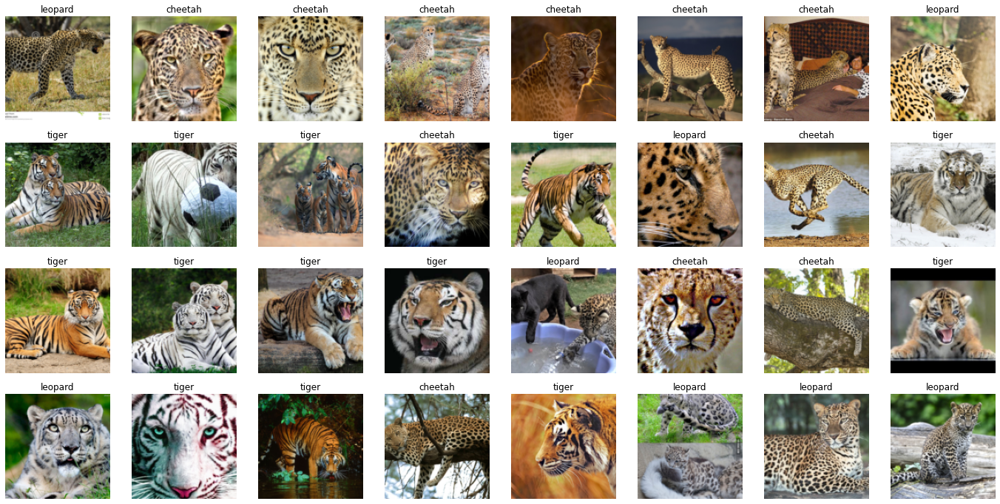

In [12]:
dls = bigcats.dataloaders(path)
dls.valid.show_batch(max_n=32, nrows=4)

We might see few mislabeled items here and there. Let's first see how our initial training goes and then improve our performance from there.
Let's first see what sort of data augmentation we've available in FastAI

In [13]:
doc(aug_transforms) #built in image transformations

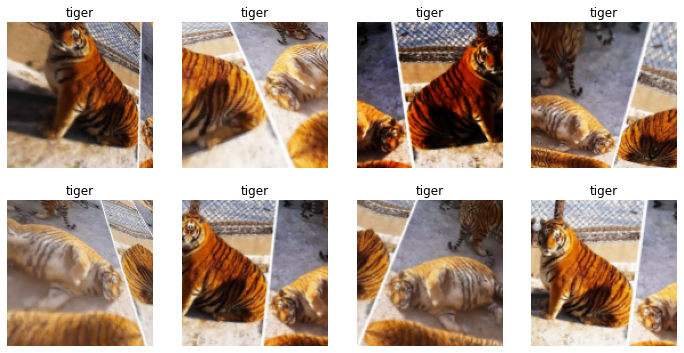

In [14]:
bigcats_temp = bigcats.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = bigcats.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

#Create Data

Finally, lets load the data and then create a cnn learner for training our model.
We'll utilize Resnet-17 as our base model.

In [65]:
bigcats = bigcats.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = bigcats.dataloaders(path)

# Transfer Learning
We'll use a pretrained Resnet model trained on ImageNet dataset.
This allows us to utilize what the model has already learnt on a general purpose dataset. With the limited dataset that we have, transfer learning gives us higher accuracy with reduced risk of over-fitting


In [66]:
learn = cnn_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,1.396133,0.398163,0.157143,00:16


epoch,train_loss,valid_loss,error_rate,time
0,0.441738,0.238948,0.100000,00:16
1,0.321264,0.182417,0.071429,00:16
2,0.247223,0.156583,0.042857,00:16
3,0.205039,0.133469,0.028571,00:16
4,0.171562,0.122118,0.028571,00:16


# Model performance
Let's plot the confusion matrix too see how many images were correctly classified.

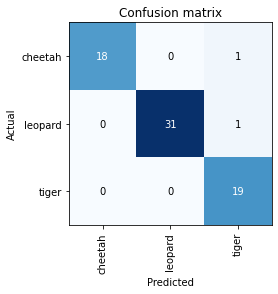

In [67]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

The loss is a number that is higher if the model is incorrect (especially if it's also confident of its incorrect answer), or if it's correct, but not confident of its correct answer. For now, plot_top_losses shows us the images with the highest loss in our dataset. As the title of the output says, each image is labeled with four things: prediction, actual (target label), loss, and probability. The probability here is the confidence level, from zero to one, that the model has assigned to its prediction.
Let's the top 10 images with the highest error rate.

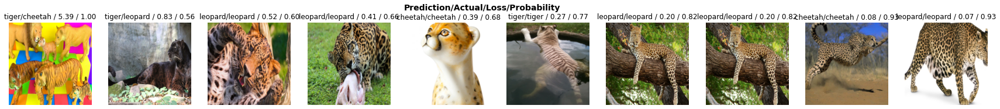

In [68]:
interp.plot_top_losses(10, nrows=1)

So we do see lot of mis-classification, this gives us an opportunity to do some data cleaning with FastAI's inbuilt methods.
It includes a handy GUI for data cleaning called **ImageClassifierCleaner** that allows you to choose a category and the training versus validation set and view the highest-loss images (in order), along with menus to allow images to be selected for removal or relabeling:

In [60]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [64]:
#clean up and reassign the images : Run this cell each time the any category is corrected.
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat/os.path.basename(cleaner.fns[idx]))

# Reflect
Once all the data has been corrected, go back to previous cell labeled '[Create Data](https://colab.research.google.com/drive/1Lh_IV6cSC12rMxpB9g7KP0TqrZMi5hIg#scrollTo=GLQqir5Z5GTL&line=1&uniqifier=1)' and re-tune the model, chances are you'll observe better performance. 

A word of caution is needed, excessive tuning of validation set may lead to better performance while training but the model may perform poorly on images in the wild. So bit of mis-labeling is fine and adds as a source of noise.

# Export and deploy the trained model
Let's export the model for deployment. We'll save it in our google drive. In a separate notebook, we'll deploy our aswesome model on the cloud for use by everyone!

In [74]:
learn.export()
shutil.copyfile('export.pkl','/content/gdrive/My Drive/bigcatclassifier.pkl')

'/content/gdrive/My Drive/bigcatclassifier.pkl'

# Prediction using the saved model

Let's load the saved model and see how it performs with a different image
not present in our training/validation set.

In [75]:
learn_inf = load_learner('/content/gdrive/My Drive/bigcatclassifier.pkl')

In [79]:
learn_inf.predict('leopard.jfif')

('leopard', tensor(1), tensor([1.1031e-01, 8.8945e-01, 2.3545e-04]))

In [80]:
learn_inf.dls.vocab

['cheetah', 'leopard', 'tiger']